In [27]:
import numpy as np # linear algebra
import librosa
import librosa.display
import matplotlib.pyplot as plt
%matplotlib inline

import sklearn

import warnings
warnings.filterwarnings('ignore')

In [ ]:
'''
An audio signal is represented in the form of an audio signal having parameters such as frequency,
bandwidth, decibel etc. A typical audio signal can be expressed as a function of Amplitude and Time.

These sounds are available in many formats which makes it possible for the computer to read and analyse them. Some examples are:

-mp3 format
-WMA (Windows Media Audio) format
-wav (Waveform Audio File) format

'''

In [5]:
audio_path = 'audio_samples/OSR_us_000_0010_8k.wav'
x , sr = librosa.load(audio_path)

In [6]:
print(type(x), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [7]:
print(x.shape, sr)

(741390,) 22050


In [8]:
#resample the audio to 44.1 KHz

In [9]:
librosa.load(audio_path, sr=44100)

(array([-0.02815123, -0.03330056, -0.03725448, ..., -0.00464273,
        -0.00290079,  0.        ], dtype=float32),
 44100)

In [10]:
import IPython.display as ipd
ipd.Audio(audio_path)

In [ ]:
#visualizing audio

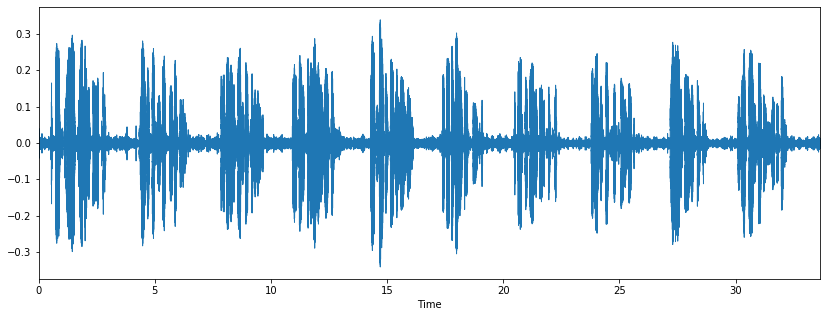

In [13]:
plt.figure(figsize = (14,5))
librosa.display.waveplot(x, sr = sr)

In [14]:
#1 Spectrogram
'''
visual representation of the spectrum of frequencies of sound or other signals 
as they vary with time. Spectrograms are sometimes called sonographs, voiceprints,
or voicegrams. When the data is represented in a 3D plot, they may be called
waterfalls. In 2-dimensional arrays, the first axis is frequency while the second axis is time.
'''

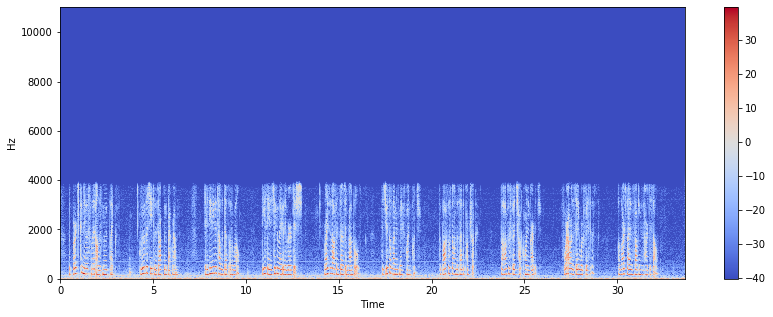

In [16]:
X = librosa.stft(x)
X_db = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(X_db, sr = sr, x_axis='time', y_axis='hz')
plt.colorbar()

In [17]:
#changing the data to logarithmic will help in better understanding

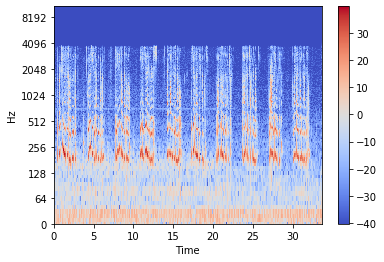

In [18]:
librosa.display.specshow(X_db, sr = sr, x_axis='time', y_axis='log')
plt.colorbar()

In [19]:
# 2. Feature Extraction

In [ ]:
'''Zero Crossing Rate- the rate at which the signal changes from positive to negative or back.'''

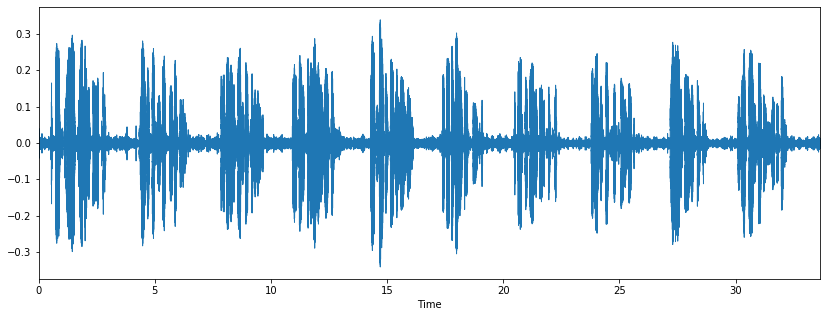

In [20]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

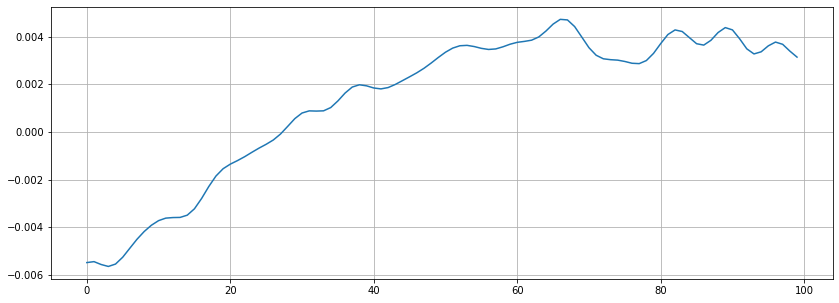

In [21]:
#let's zoom in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14,5))
plt.plot(x[n0:n1])
plt.grid()

In [22]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

1


In [24]:
#Spectral Centroid - indicates the centre of Mass,  is calculated as the weighted mean of the frequencies present in the sound

In [25]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

(1449,)

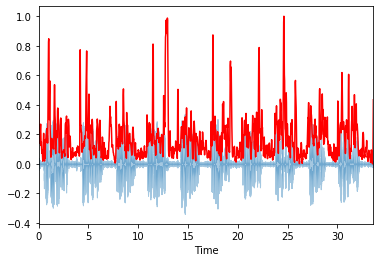

In [28]:
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

In [29]:
#Spectral Rolloff - measure the shape of the signal; represents the frequency below which a specified percentage of the total spectral energy

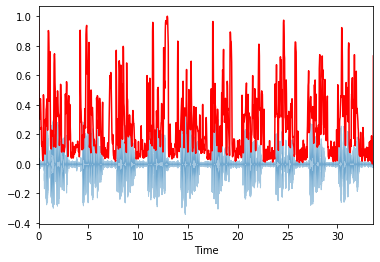

In [30]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

In [ ]:
#Mel-Frequency Cepstral Coefficients
#The Mel frequency cepstral coefficients (MFCCs) of a signal are a
# small set of features (usually about 10–20) which concisely describe
# the overall shape of a spectral envelope. It models the characteristics
# of the human voice.

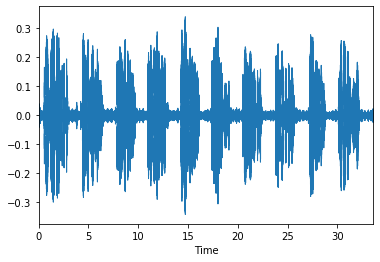

In [32]:
x, fs = librosa.load('audio_samples/OSR_us_000_0010_8k.wav')
librosa.display.waveplot(x, sr=sr)

In [33]:
mfccs = librosa.feature.mfcc(x, sr=fs)
print(mfccs.shape)

(20, 1449)


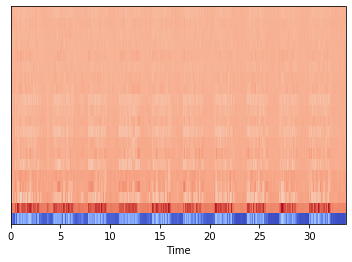

In [34]:
#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

[-5.2652824e-09  1.0530565e-08  7.8979241e-09 -5.2652824e-09
  1.0530565e-08  5.2652824e-09 -5.2652824e-09  1.3163206e-09
  5.2652824e-09  7.8979241e-09 -5.2652824e-09  0.0000000e+00
  5.2652824e-09  5.2652824e-09  0.0000000e+00  5.2652824e-09
  0.0000000e+00 -1.0530565e-08 -1.0530565e-08 -1.0530565e-08]
[1.         1.         1.0000001  1.0000001  1.0000001  1.0000001
 1.         1.         1.         0.9999998  1.         0.99999994
 1.         1.         1.         0.99999994 1.         1.
 0.99999994 1.        ]


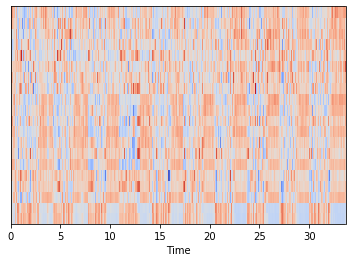

In [35]:
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')